# Load the LGMR data (mean of the ensemble)

In [2]:
import xarray as xr
# open the 'LGMR_GMST_ens.nc' file
ds_sat = xr.open_dataset('data/LGMR_SAT_climo.nc')
ds_sat.info

d:\Users\User\anaconda3\envs\pz_venv_causal\lib\site-packages\xarray\coding\variables.py:147: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  condition |= data == fv


<bound method Dataset.info of <xarray.Dataset>
Dimensions:  (lat: 96, lon: 144, age: 120)
Coordinates:
  * lat      (lat) float32 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * age      (age) float32 100.0 300.0 500.0 ... 2.35e+04 2.37e+04 2.39e+04
Data variables:
    sat      (age, lat, lon) float32 ...
    sat_std  (age, lat, lon) float32 ...>

# Crop the data for age>11

In [3]:

# ds_sat = ds_sat.where(ds_sat.age>=11000, drop=True)

ds_sat = ds_sat.where(ds_sat.age>=11000, drop=True)

d:\Users\User\anaconda3\envs\pz_venv_causal\lib\site-packages\xarray\coding\variables.py:147: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  condition |= data == fv


# Crop win GMM

In [17]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
from toolbox import PCA_functions as pf
from toolbox import GMM_functions as gf



# ── 1.  Pre‑process a single age window ────────────────────────────────────
def prep_PCA_window(
        ds: xr.Dataset,
        start_age: float,
        window: float = 7_000,

):
    """


    Returns
    -------
    eofs, pcs, exp_var : np.ndarray
        EOF patterns, principal components and explained‑variance spectrum.
    ds_win : xr.Dataset
        The centred & weighted window (handy if you need it).
    """
    end_age = start_age + window
    if end_age > float(ds['age'].max()):
        raise ValueError("Window exceeds available age range.")

    # 1a. Crop and copy
    ds_win = ds.sel(age=slice(start_age, end_age)).copy()

    # 1b. Centre & weight
    ds_win = pf.center_data(ds_win)
    ds_win = pf.apply_weighting(ds_win)

    # 1c. PCA / EOF
    exp_var, eofs, pcs = pf.sat_PCA(ds_win)


    return eofs, pcs, exp_var, ds_win


def plot_pcs_eofs(        ds_win: xr.Dataset,
        pcs: np.ndarray, eofs: np.ndarray,
        exp_var: np.ndarray, start_age: float,
        window: float = 7_000,
        pc1_flip=False,
        pc2_flip=False,
        eof1_flip=False,
        eof2_flip=False,):
    if pc1_flip:
        pcs[:, 0] *= -1
    if pc2_flip:
        pcs[:, 1] *= -1
    if eof1_flip:
        eofs[:,0] *= -1
    if eof2_flip:
        eofs[:,:] *= -1


    end_age = start_age + window
    fig_pc, _ = pf.plot_pcs(
        ds_win['age'].values, pcs, exp_var[:2]
    )
    fig_pc.suptitle(f'PCs  ({int(start_age)}–{int(end_age)} yr BP)', y=1.02)
    plt.show()

    fig_eof, _ = pf.plot_eof_map(
        eofs, ds_win['lat'].values, ds_win['lon'].values
    )
    fig_eof.suptitle(f'EOFs  ({int(start_age)}–{int(end_age)} yr BP)', y=0.98)
    plt.show()


# ── 2.  Run a Gaussian‑mixture model on EOFs ───────────────────────────────
def run_GMM_on_eofs(
        eofs,
        ds_full: xr.Dataset,
        n_components: int = 4,
        do_plots: bool = True,
):
    """


    Parameters
    ----------
    eofs : np.ndarray
        EOFs as returned by `prep_PCA_window` (shape: mode × space).
    ds_full : xr.Dataset
        The full SAT dataset – needed because gf.GMM4EOFS expects grid info.
    n_components : int, default 4
        Number of mixture components (clusters).

    Returns
    -------
    ds_GMM_climo : xr.Dataset
        Map of most‑likely GMM labels (& their statistics).
    probs : xr.DataArray
        Posterior probabilities (component likelihoods per grid point).
    """
    ds_GMM_climo, probs = gf.GMM4EOFS(eofs, ds_full, n_components=n_components)

    if do_plots:
        gf.plot_labels(ds_GMM_climo)

    return ds_GMM_climo, probs


# ── 3.  (Optional) convenience wrapper ─────────────────────────────────────
def full_GMM_pipeline(
        ds: xr.Dataset,
        start_age: float,
        window: float = 7_000,
        n_components: int = 4,
        do_plots: bool = True,
):
    """
    One‑liner that chains `prep_PCA_window` and `run_GMM_on_eofs`.
    Returns everything from both steps.
    """
    eofs, pcs, exp_var, ds_win = prep_PCA_window(
        ds, start_age, window, do_plots=do_plots
    )
    ds_GMM_climo, probs = run_GMM_on_eofs(
        eofs, ds, n_components=n_components, do_plots=do_plots
    )
    diagnostics = dict(exp_var=exp_var, pcs=pcs, eofs=eofs)

    return ds_GMM_climo, probs, diagnostics


In [18]:

eofs, pcs, exp_var, ds_win = prep_PCA_window(
    ds_sat,
    start_age=11_000,
    window=7_000,
)

shape of the weight: (96,)
shape of the reshaped sat_centered_weighted: (35, 13824)
shape of the reshaped sat_centered_weighted: (13824, 35)
shape of u, s, vh: (13824, 13824) (35,) (35, 35)
shape of EOFs: (13824, 2)
shape of PCs: (35, 2)


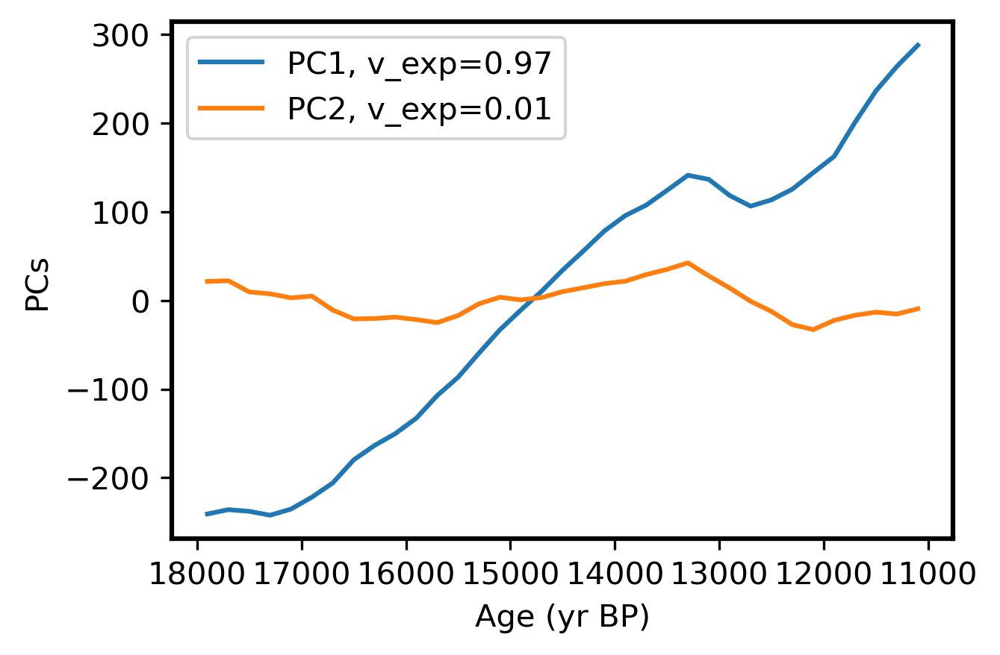

d:\VScode\Last_deglaciation\toolbox\PCA_functions.py:309: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


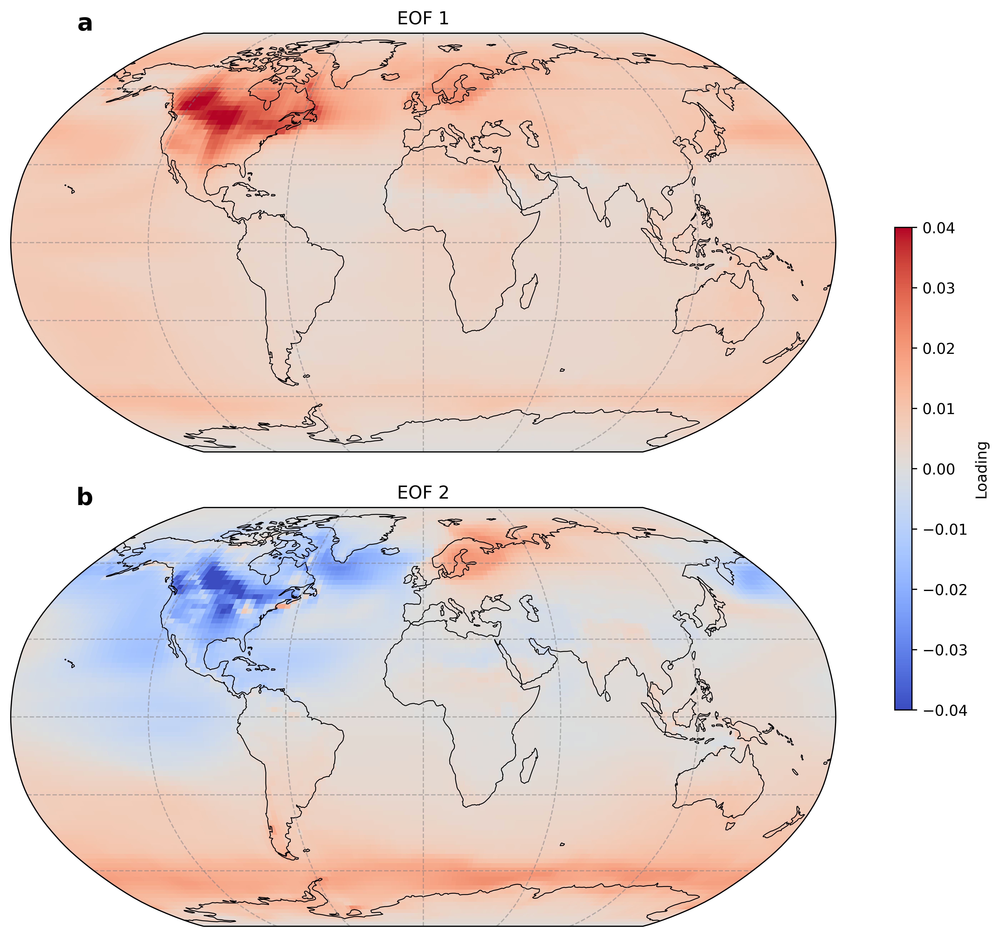

In [19]:
plot_pcs_eofs(
    ds_win=ds_win, 
    pcs=pcs, eofs=eofs,
    exp_var=exp_var,
    start_age=11_000,
    window=7_000,
    eof1_flip=False,
    eof2_flip=True,)

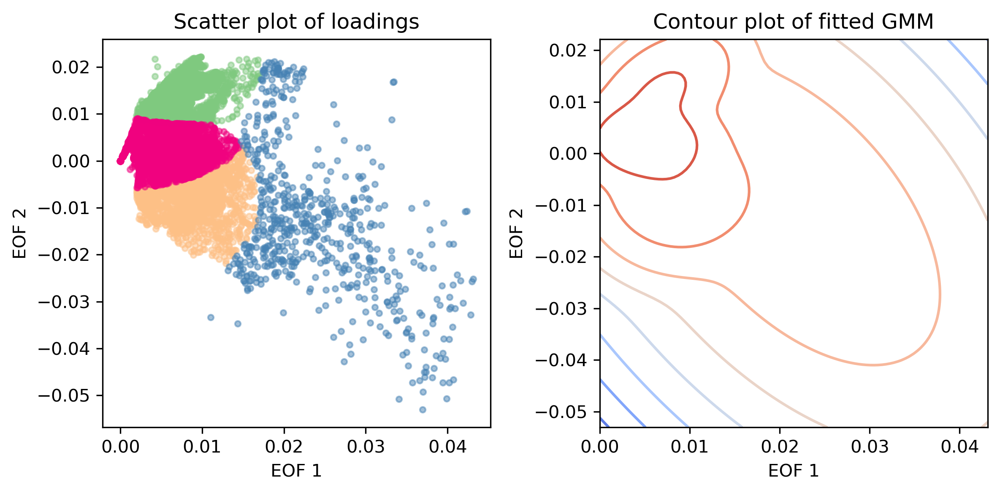

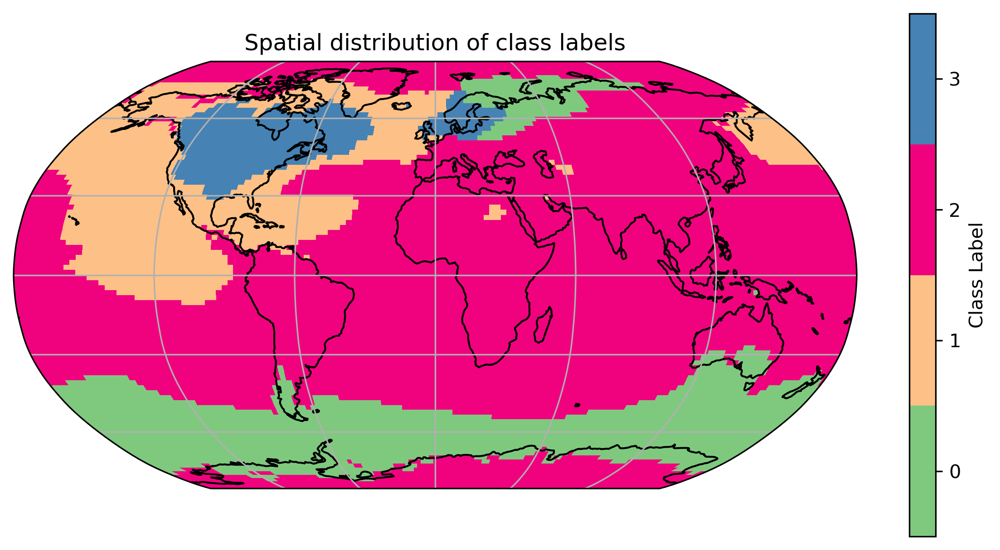

In [25]:
ds_GMM, posterior = run_GMM_on_eofs(
    eofs,
    ds_sat,
    n_components=4,
    do_plots=True
)

In [1]:

import matplotlib.pyplot as plt
import xarray as xr
from toolbox import PCA_functions as pf
from toolbox import GMM_functions as gf


def run_GMM_on_window(
        ds: xr.Dataset,
        start_age: float,
        window: float = 7_000,
        n_components: int = 4,
        do_plots: bool = True,
):
    """


    Parameters
    ----------
    ds : xr.Dataset
        Your SAT dataset (must contain dimensions 'age', 'lat', 'lon'
        and variables 'sat' and optionally 'sat_std').
    start_age : float
        Window’s lower bound (years BP).
    window : float, default 7000
        Length of the window (years).
    n_components : int, default 4
        How many Gaussian‐mixture clusters.
    do_plots : bool, default True
        If True, show the PC time‑series, EOF maps and GMM labels.

    Returns
    -------
    ds_GMM_climo : xr.Dataset
        Map of most‑likely GMM labels (& their statistics).
    probs : xr.DataArray
        Posterior probabilities (one layer per component).
    extra : dict
        exp_var, pcs, eofs – in case you want to inspect or save them.
    """
    end_age = start_age + window
    if end_age > ds['age'].max():
        raise ValueError("Window exceeds available age range.")

    # 1. Crop and copy
    ds_win = ds.sel(age=slice(start_age, end_age)).copy()

    # 2. Centre & weight
    ds_win = pf.center_data(ds_win)
    ds_win = pf.apply_weighting(ds_win)

    # 3. PCA / EOF
    exp_var, eofs, pcs = pf.sat_PCA(ds_win)

    # 4. Plots (optional)
    if do_plots:
        # PCs
        fig_pc, _ = pf.plot_pcs(ds_win['age'].values, pcs, exp_var[:2])
        fig_pc.suptitle(f'PCs  ({int(start_age)}–{int(end_age)} yr BP)', y=1.02)
        plt.show()

        # EOFs
        fig_eof, _ = pf.plot_eof_map(eofs,
                                     ds_win['lat'].values,
                                     ds_win['lon'].values)
        fig_eof.suptitle(f'EOFs  ({int(start_age)}–{int(end_age)} yr BP)', y=0.98)
        plt.show()

    # 5. Gaussian Mixture on EOFs
    ds_GMM_climo, probs = gf.GMM4EOFS(eofs, ds, n_components=n_components)
    if do_plots:
        gf.plot_labels(ds_GMM_climo)

    # 6. Return everything useful
    extra = dict(exp_var=exp_var, pcs=pcs, eofs=eofs)
    return ds_GMM_climo, probs, extra


shape of the weight: (96,)
shape of the reshaped sat_centered_weighted: (35, 13824)
shape of the reshaped sat_centered_weighted: (13824, 35)
shape of u, s, vh: (13824, 13824) (35,) (35, 35)
shape of EOFs: (13824, 2)
shape of PCs: (35, 2)


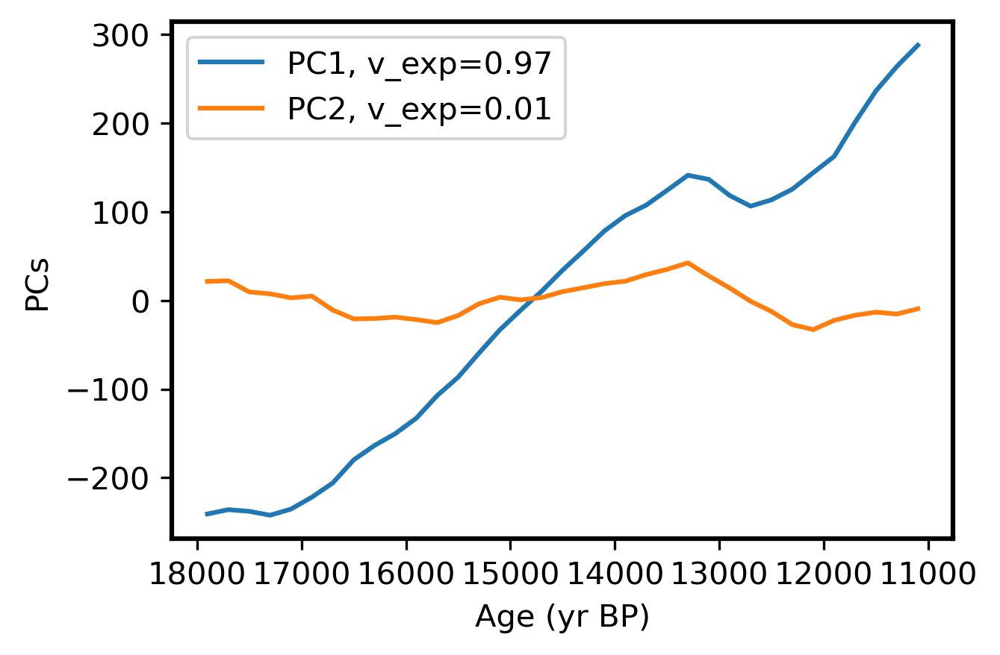

d:\VScode\Last_deglaciation\toolbox\PCA_functions.py:309: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


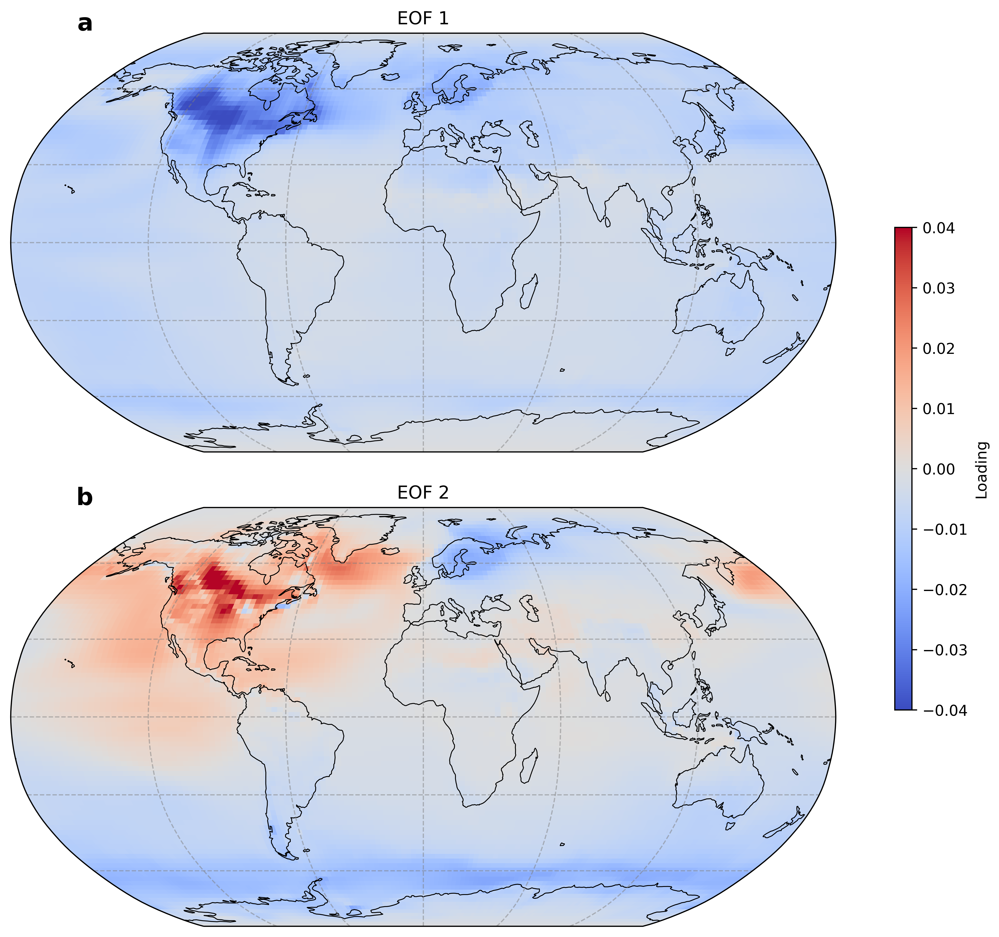

d:\Users\User\anaconda3\envs\pz_venv_causal\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "d:\Users\User\anaconda3\envs\pz_venv_causal\lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
  File "d:\Users\User\anaconda3\envs\pz_venv_causal\lib\subprocess.py", line 493, in run
    with Popen(*popenargs, **kwargs) as process:
  File "d:\Users\User\anaconda3\envs\pz_venv_causal\lib\subprocess.py", line 858, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "d:\Users\User\anaconda3\envs\pz_venv_causal\lib\subprocess.py", line 1327, in _execute_child
    hp, ht, pi

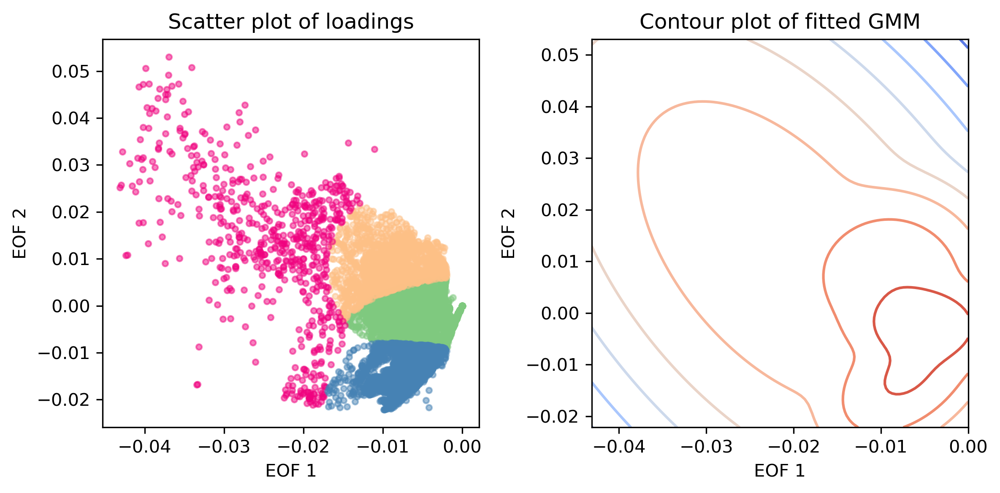

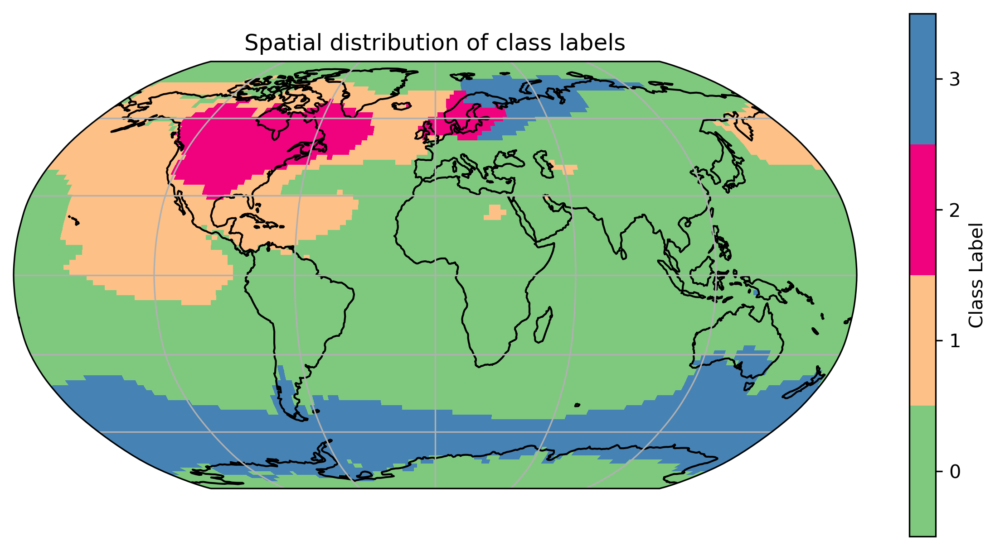

In [4]:

ds_GMM, posterior, diagnostics = run_GMM_on_window(
    ds_sat,
    start_age=11_000,   # window begins at 11 ka BP
    window=7_000,       # 7 kyr window (same as before)
    n_components=4,
    do_plots=True
)


# Sliding Win GMM

4 windows will be analysed:
11100–18100, 13100–20100, 15100–22100, 17100–24100 yr BP


Sliding-window PCA:   0%|          | 0/4 [00:00<?, ?it/s]

shape of the weight: (96,)
shape of the reshaped sat_centered_weighted: (36, 13824)
shape of the reshaped sat_centered_weighted: (13824, 36)
shape of u, s, vh: (13824, 13824) (36,) (36, 36)
shape of EOFs: (13824, 2)
shape of PCs: (36, 2)


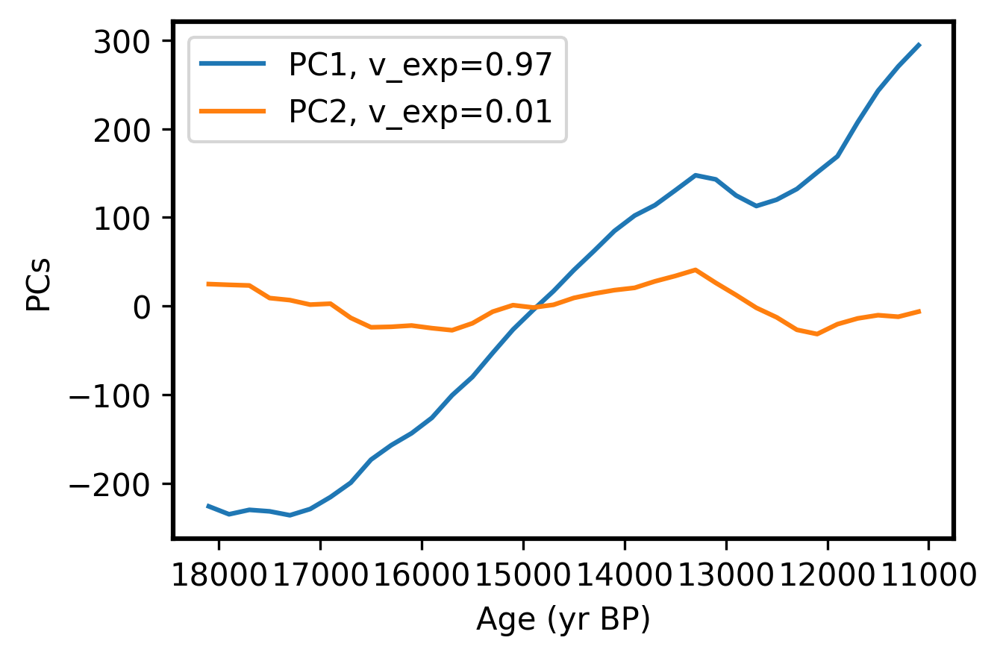

d:\VScode\Last_deglaciation\toolbox\PCA_functions.py:309: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


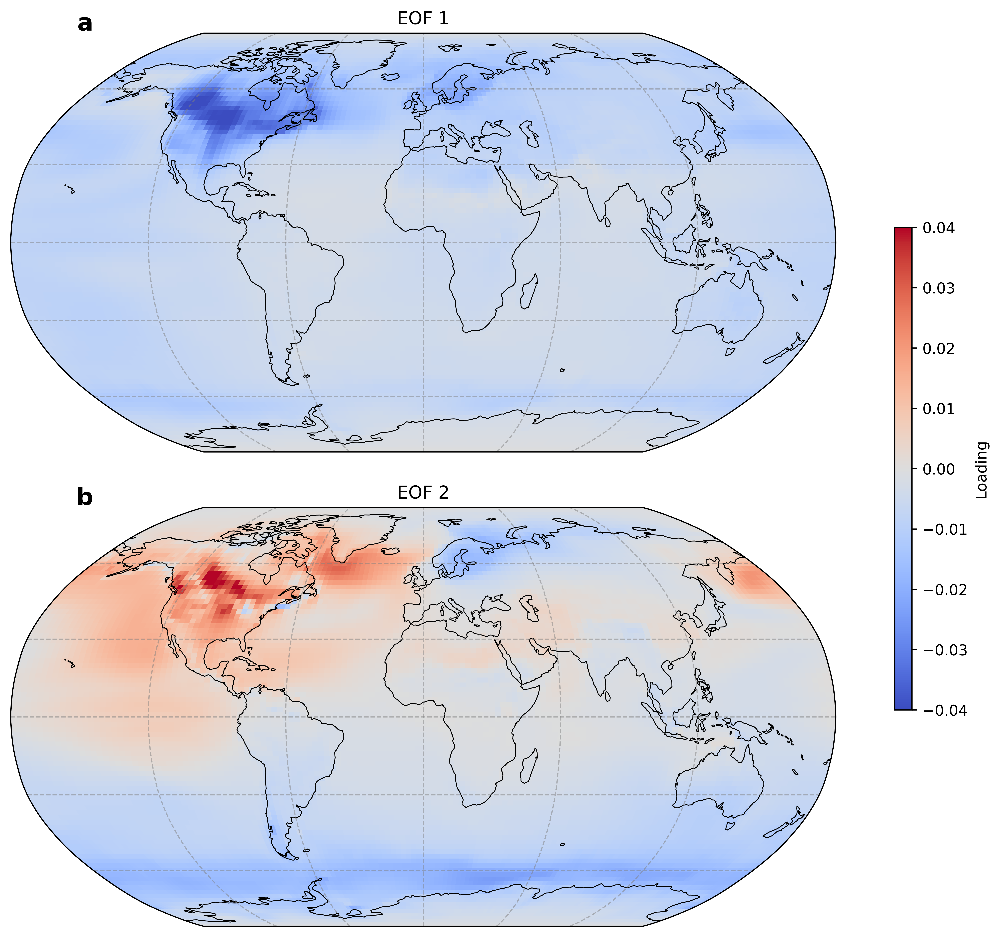

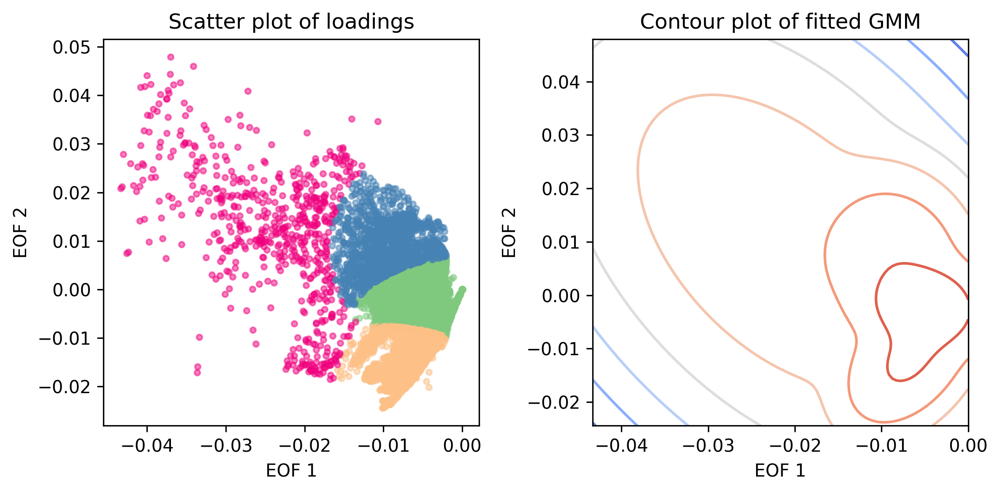

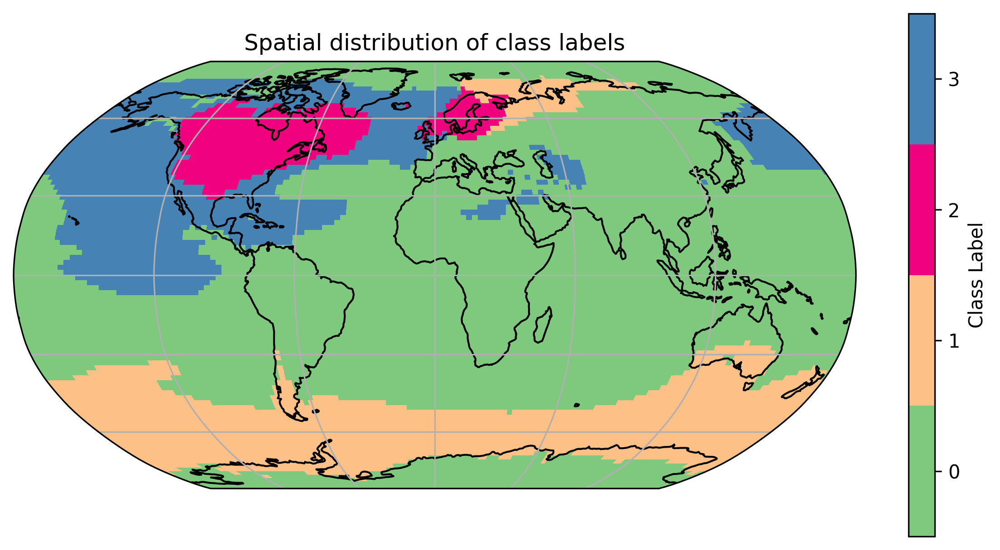

Sliding-window PCA:  25%|██▌       | 1/4 [00:28<01:24, 28.17s/it]

shape of the weight: (96,)
shape of the reshaped sat_centered_weighted: (36, 13824)
shape of the reshaped sat_centered_weighted: (13824, 36)
shape of u, s, vh: (13824, 13824) (36,) (36, 36)
shape of EOFs: (13824, 2)
shape of PCs: (36, 2)


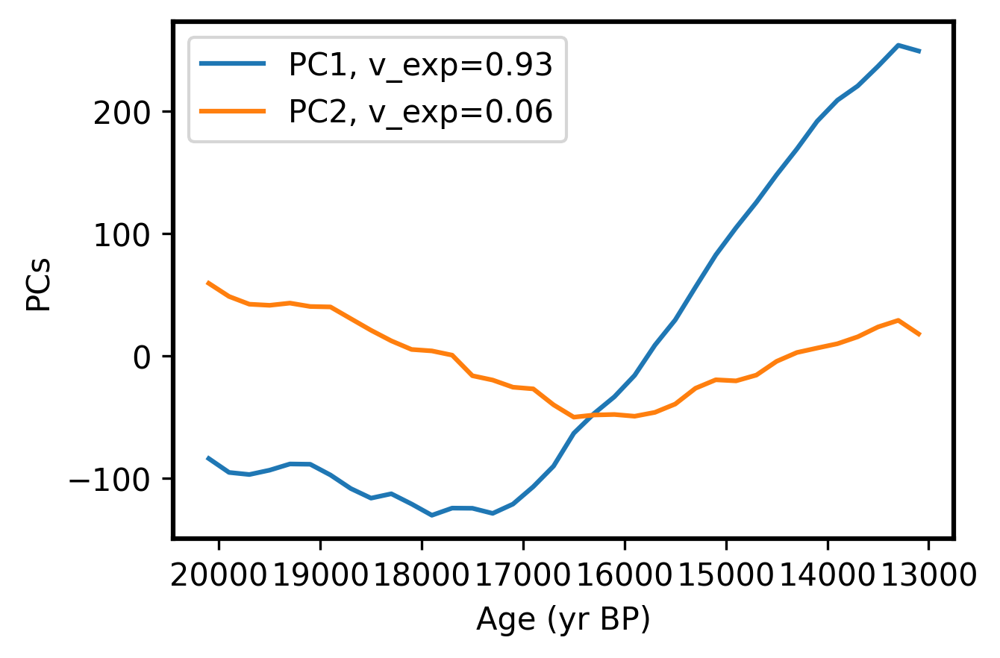

d:\VScode\Last_deglaciation\toolbox\PCA_functions.py:309: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


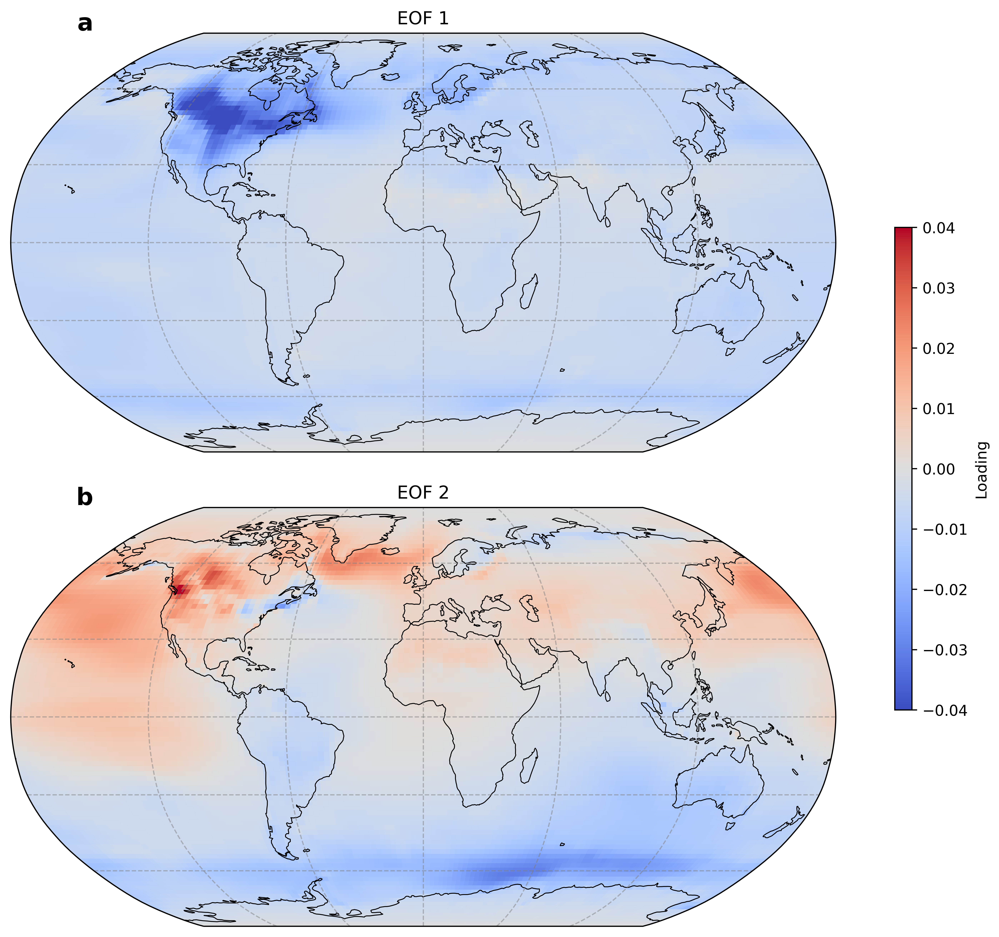

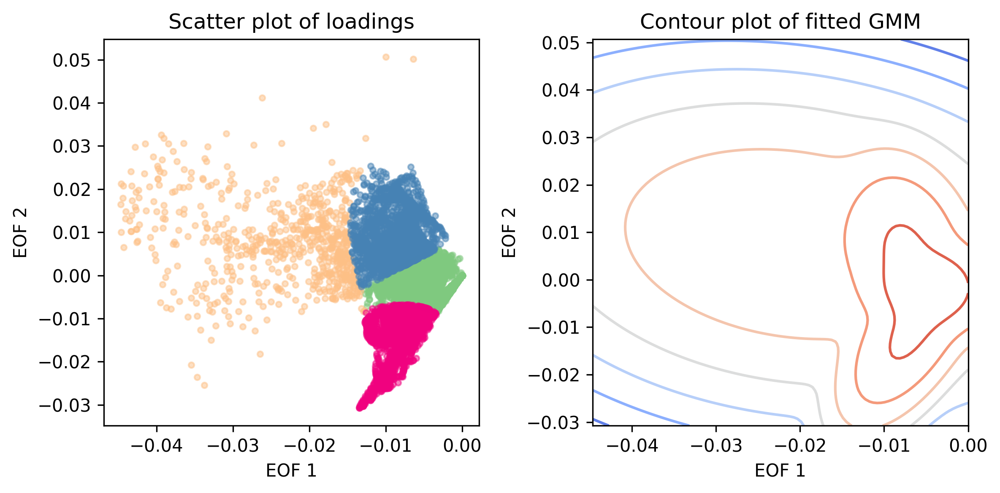

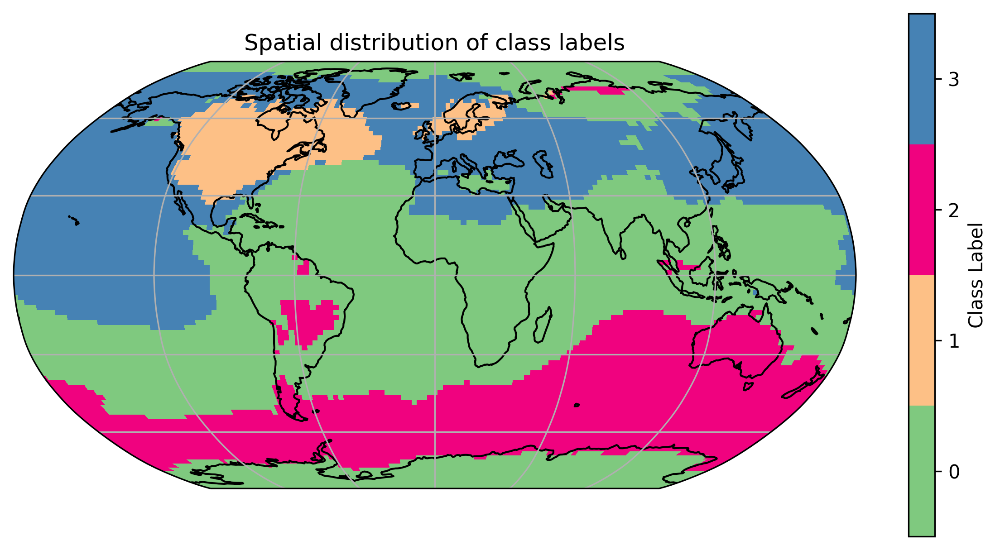

Sliding-window PCA:  50%|█████     | 2/4 [00:55<00:55, 27.70s/it]

shape of the weight: (96,)
shape of the reshaped sat_centered_weighted: (36, 13824)
shape of the reshaped sat_centered_weighted: (13824, 36)
shape of u, s, vh: (13824, 13824) (36,) (36, 36)
shape of EOFs: (13824, 2)
shape of PCs: (36, 2)


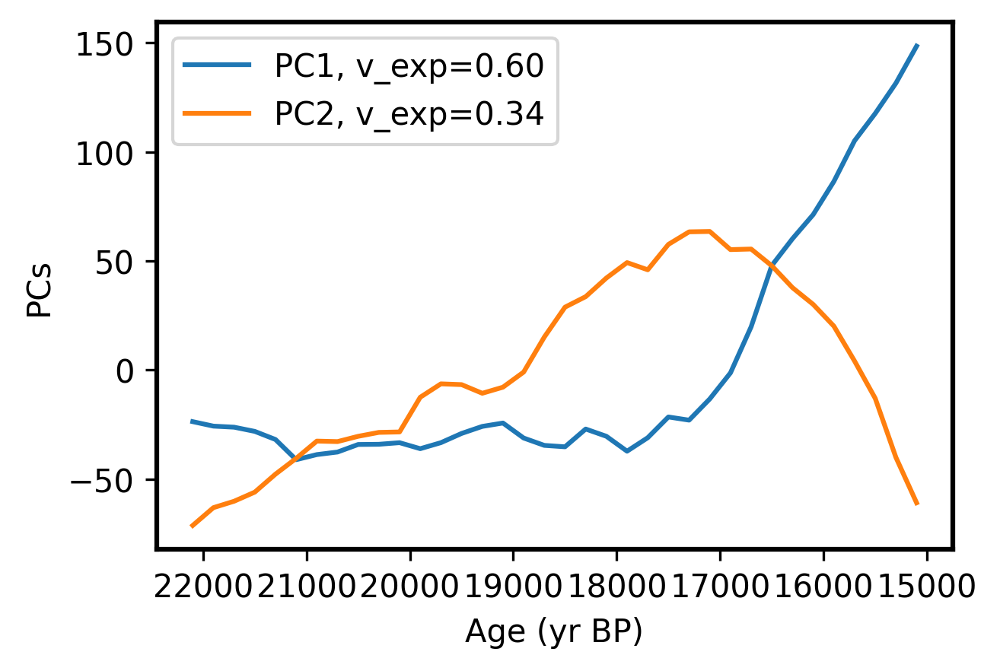

d:\VScode\Last_deglaciation\toolbox\PCA_functions.py:309: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


In [ ]:
# --- imports ---------------------------------------------------------------
import numpy as np
from tqdm import tqdm                    # nice progress bar (pip install tqdm)
import matplotlib.pyplot as plt
import xarray as xr

from toolbox import PCA_functions as pf  # your helper module
import importlib
importlib.reload(pf)                    # make sure latest edits are active


from toolbox import GMM_functions as gf
import importlib
importlib.reload(gf)
# ---------------------------------------------------------------------------


# ── 1.  Sliding-window bookkeeping ─────────────────────────────────────────
WINDOW = 7_000            # yr
STEP   = 2_000            # yr

ages = ds_sat['age'].values
ages_sorted = np.sort(ages)              # make sure they are monotonic
t_min, t_max = ages_sorted[0], ages_sorted[-1]

# starting ages of each window; e.g. 11 ka, 12 ka, … 19 ka
starts = np.arange(t_min, t_max - WINDOW + STEP, STEP)

print(f'{len(starts)} windows will be analysed:')
print(', '.join([f'{int(s)}–{int(s+WINDOW)}' for s in starts]), 'yr BP')


# ── 2.  Loop through the windows and run PCA ───────────────────────────────
results = []   # to store PCs/EOFs/variance if you want to inspect later

for s in tqdm(starts, desc='Sliding-window PCA'):
    e = s + WINDOW
    ds_win = ds_sat.sel(age=slice(s, e)).copy()      # deep copy → keep clean

    # 2.1  centre & weight **within that window**
    ds_win = pf.center_data(ds_win)
    ds_win = pf.apply_weighting(ds_win)

    # 2.2  PCA / EOF (returns full spectrum; we only need the first two)
    exp_var, eofs, pcs = pf.sat_PCA(ds_win)

    # 2.3  ---- plotting ----------------------------------------------------
    # PCs
    fig_pc, _ = pf.plot_pcs(
        ds_win['age'].values,
        pcs,
        exp_var[:2]
    )
    fig_pc.suptitle(f'PCs  ({int(s)}–{int(e)} yr BP)', y=1.02)
    plt.show()

    # EOF maps (1 & 2)
    fig_eof, _ = pf.plot_eof_map(
        eofs,
        ds_win['lat'].values,
        ds_win['lon'].values
    )
    fig_eof.suptitle(f'EOFs  ({int(s)}–{int(e)} yr BP)', y=0.98)
    plt.show()



    ds_GMM_climo,probs=gf.GMM4EOFS(eofs, ds_sat,n_components=4)
    gf.plot_labels(ds_GMM_climo)



    # ----------------------------------------------------------------------

    # optional: archive results for later comparison
    results.append(
        dict(start=s, end=e,
             exp_var=exp_var[:10],  # keep first 10 for diagnostics
             pcs=pcs, eofs=eofs)
    )

